In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

Recebendo inputs do kaggle e separando em pastas

In [2]:
import os

# Caminhos para as pastas
train_color_dir = "/kaggle/working/train_color"
train_gray_dir = "/kaggle/working/train_gray"
val_color_dir = "/kaggle/working/val_color"
val_gray_dir = "/kaggle/working/val_gray"

# Função para criar pastas, se elas não existirem
def create_folders():
    os.makedirs(train_color_dir, exist_ok=True)
    os.makedirs(train_gray_dir, exist_ok=True)
    os.makedirs(val_color_dir, exist_ok=True)
    os.makedirs(val_gray_dir, exist_ok=True)

# Criar pastas
create_folders()

print("Pastas criadas com sucesso!")


Pastas criadas com sucesso!


In [3]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Caminhos para as pastas
color_dir = "/kaggle/input/landscape-image-colorization/landscape Images/color"
gray_dir = "/kaggle/input/landscape-image-colorization/landscape Images/gray"
train_color_dir = "/kaggle/working/train_color"
train_gray_dir = "/kaggle/working/train_gray"
val_color_dir = "/kaggle/working/val_color"
val_gray_dir = "/kaggle/working/val_gray"

# Listar imagens (assumindo que os pares têm o mesmo nome de arquivo)
color_images = sorted(os.listdir(color_dir))
gray_images = sorted(os.listdir(gray_dir))

# Extraindo nomes dos arquivos (sem a extensão)
image_names = [os.path.splitext(img)[0] for img in color_images]

# Dividir em treino e validação (usando 20% para validação, por exemplo)
train_names, val_names = train_test_split(image_names, test_size=0.2, random_state=42)

# Função para mover arquivos
def copy_images(image_names, src_color_dir, src_gray_dir, dst_color_dir, dst_gray_dir):
    for name in image_names:
        shutil.copy(os.path.join(src_color_dir, f"{name}.jpg"), os.path.join(dst_color_dir, f"{name}.jpg"))
        shutil.copy(os.path.join(src_gray_dir, f"{name}.jpg"), os.path.join(dst_gray_dir, f"{name}.jpg"))

# Mover os arquivos
copy_images(train_names, color_dir, gray_dir, train_color_dir, train_gray_dir)
copy_images(val_names, color_dir, gray_dir, val_color_dir, val_gray_dir)

print("Imagens copiadas com sucesso!")


Imagens copiadas com sucesso!


Importando dependências

In [4]:
# Importe pacotes

import os
import cv2
import numpy as np
import pandas as pd
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import random
import shutil

Preparando imagens

In [5]:
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image

# Definindo transformações para as imagens
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Redimensiona as imagens para um tamanho fixo
    transforms.ToTensor()  # Converte as imagens para tensores
])

# Classe customizada para carregar as imagens
class CustomDataset(Dataset):
    def __init__(self, gray_dir, color_dir, image_names, transform=None):
        self.gray_dir = gray_dir
        self.color_dir = color_dir
        self.image_names = image_names
        self.transform = transform

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        gray_image_path = os.path.join(self.gray_dir, f"{self.image_names[idx]}.jpg")
        color_image_path = os.path.join(self.color_dir, f"{self.image_names[idx]}.jpg")

        gray_image = Image.open(gray_image_path).convert("L")
        color_image = Image.open(color_image_path).convert("RGB")

        if self.transform:
            gray_image = self.transform(gray_image)
            color_image = self.transform(color_image)

        return gray_image, color_image

# Criando datasets
train_dataset = CustomDataset(train_gray_dir, train_color_dir, train_names, transform=transform)
val_dataset = CustomDataset(val_gray_dir, val_color_dir, val_names, transform=transform)

# Criando DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=True, num_workers=4, pin_memory=True)

print("DataLoaders criados com sucesso!")

DataLoaders criados com sucesso!


Definindo Gerador

In [6]:
# U-Net

import torch
import torch.nn as nn
import torch.nn.functional as F

class UNet(nn.Module):
    def __init__(self, image_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1):
        super(UNet, self).__init__()

        self.image_dim = image_dim  # Dimensões da imagem de entrada (C, H, W)
        self.depth = depth 
        self.n_channels = n_channels
        self.conv_kernel_size = conv_kernel_size
        self.conv_stride = conv_stride
        self.conv_padding = conv_padding
        self.pool_kernel_size = pool_kernel_size
        self.pool_stride = pool_stride
        self.pool_padding = pool_padding
        self.transpose_kernel_size = transpose_kernel_size
        self.transpose_stride = transpose_stride
        self.transpose_padding = transpose_padding
        
        # To RGB
        self.to_rgb = nn.Conv2d(1, 3, kernel_size=1)

        # Encoder
        self.encoders = nn.ModuleList([self.conv_block(3 if i == 0 else self.n_channels * (2 ** (i-1)), self.n_channels * (2 ** i)) for i in range(self.depth)])
        self.pool = nn.MaxPool2d(kernel_size=self.pool_kernel_size, stride=self.pool_stride, padding=self.pool_padding)

        # Bottleneck
        self.bottleneck = self.conv_block(self.n_channels * (2 ** (self.depth-1)), self.n_channels * (2 ** self.depth))

        # Decoder
        self.decoders = nn.ModuleList([self.conv_transpose(self.n_channels * (2 ** (i+2)), self.n_channels * (2 ** i)) for i in range(self.depth-2, -1, -1)])

        # Final conv layer
        self.final_conv = nn.Conv2d(self.n_channels, 3, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        # Camada convolucional com normalização e função de ativação; 2 vezes
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=self.conv_kernel_size, stride=self.conv_stride, padding=self.conv_padding),
            nn.BatchNorm2d(out_channels),  # Normalização para acelerar o treinamento
            nn.ReLU(inplace=True),  # Função de ativação (zera os valores negativos)
            nn.Conv2d(out_channels, out_channels, kernel_size=self.conv_kernel_size, stride=self.conv_stride, padding=self.conv_padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def crop(self, encoder_feature, decoder_feature):
        _, _, h, w = decoder_feature.size()
        encoder_feature = F.interpolate(encoder_feature, size=(h, w), mode='bilinear', align_corners=False)  # Redimensiona a feature map do encoder
        return encoder_feature

    def conv_transpose(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=self.transpose_kernel_size, stride=self.transpose_stride, padding=self.transpose_padding),
            self.conv_block(out_channels, out_channels)
        )
    
    def forward(self, x):
        #print(f"Input shape: {x.shape}")
        encoders_features = []

        # RGB pass
        x = self.to_rgb(x)
        #print(f"After RGB pass: {x.shape}")

        # Encoder pass
        for idx, encoder in enumerate(self.encoders):
            #print("idx: ", idx)
            #print("encoder: ", encoder)
            x = encoder(x)
            encoders_features.append(x)
            #print(f"After encoder block {idx+1}: {x.shape}")
            x = self.pool(x)
            #print(f"After pooling {idx+1}: {x.shape}")

        # Bottleneck
        x = self.bottleneck(x)
        #print(f"After bottleneck: {x.shape}")
        # Doubled the block
        #print("Starting decoder pass")
        # Decoder pass
        for i, decoder in enumerate(self.decoders):
            #print("i: ", i)
            #print("decoder: ", decoder)
            encoder_feature = encoders_features[-(i+1)]
            encoder_feature = self.crop(encoder_feature, x)  # Aplica o crop nas feature maps
            #print(f"Encoder feature {i+1} after crop: {encoder_feature.shape}")

            if i != 0:
                x = torch.cat([encoder_feature, x], dim=1)  # Concatena encoder com decoder
                #print(f"After concatenation with encoder feature {i+1}: {x.shape}")

            x = decoder(x)

        # Final convolution
        x = self.final_conv(x)
        x = F.interpolate(x, size=(self.image_dim[2], self.image_dim[3]), mode='bilinear', align_corners=False)
        #print(f"Output shape after final convolution: {x.shape}")
        
        x = torch.sigmoid(x)
        
        return x

Testando gerador

In [7]:
"""# Obtendo as dimensões das imagens a partir do DataLoader
nex = next(iter(train_loader))
img_dim = nex[0].shape
label_dim = nex[1].shape
print("Img_dim: ", img_dim)
print("Label_dim: ", label_dim)
model = UNet(image_dim=img_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1)
# Configurando o dispositivo (GPU, se disponível)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Dispositivo: {device}")
model = model.to(device)  # Mover o modelo para o dispositivo


# Testando com um batch de dados do DataLoader
for images, labels in train_loader:
    # Move os dados para o dispositivo (GPU/CPU)
    images = images.to(device)
    labels = labels.to(device)
    print("Imagens e rótulos movidos para o dispositivo.")
    print(images.shape)
    print(labels.shape)
    print("Iniciando forward pass...")
    # Passa as imagens pelo modelo U-Net
    output = model(next(iter(train_loader))[0])
    
    # Exibe as dimensões das imagens, labels e da saída do modelo
    print(f"Imagens: {images.shape}")
    print(f"Labels: {labels.shape}")
    print(f"Saída do modelo: {output.shape}")
    
    # Quebrar após o primeiro batch, apenas para teste
    break"""

'# Obtendo as dimensões das imagens a partir do DataLoader\nnex = next(iter(train_loader))\nimg_dim = nex[0].shape\nlabel_dim = nex[1].shape\nprint("Img_dim: ", img_dim)\nprint("Label_dim: ", label_dim)\nmodel = UNet(image_dim=img_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1)\n# Configurando o dispositivo (GPU, se disponível)\ndevice = torch.device(\'cuda\' if torch.cuda.is_available() else \'cpu\')\nprint(f"Dispositivo: {device}")\nmodel = model.to(device)  # Mover o modelo para o dispositivo\n\n\n# Testando com um batch de dados do DataLoader\nfor images, labels in train_loader:\n    # Move os dados para o dispositivo (GPU/CPU)\n    images = images.to(device)\n    labels = labels.to(device)\n    print("Imagens e rótulos movidos para o dispositivo.")\n    print(images.shape)\n    print(labels.shape)\n    print("Iniciando forward pass...

Gerador gera uma imagem do tamanho desejado, passando pela unet

Discriminador

In [8]:

class Discriminator(nn.Module):
    def __init__(self, image_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1):
        super().__init__()

        self.image_dim = image_dim  # Dimensões da imagem de entrada (C, H, W)
        self.depth = depth 
        self.n_channels = n_channels
        self.conv_kernel_size = conv_kernel_size
        self.conv_stride = conv_stride
        self.conv_padding = conv_padding
        self.pool_kernel_size = pool_kernel_size
        self.pool_stride = pool_stride
        self.pool_padding = pool_padding
        self.transpose_kernel_size = transpose_kernel_size
        self.transpose_stride = transpose_stride
        self.transpose_padding = transpose_padding

        # Encoder
        self.encoders = nn.ModuleList([self.conv_block(3 if i == 0 else self.n_channels * (2 ** (i-1)), self.n_channels * (2 ** i)) for i in range(self.depth)])
        self.pool = nn.MaxPool2d(kernel_size=self.pool_kernel_size, stride=self.pool_stride, padding=self.pool_padding)

        # Bottleneck
        self.bottleneck = self.conv_block(self.n_channels * (2 ** (self.depth-1)), self.n_channels * (2 ** self.depth))

        # Final conv layer
        self.final_conv = nn.Conv2d(self.n_channels * (2 ** self.depth), 1, kernel_size=1)

        # Fully connected layer to reduce the dimensions to [32, 1, 1, 1]
        self.fc = nn.Linear(self.image_dim[2] * self.image_dim[3], 1)

    def conv_block(self, in_channels, out_channels):
        # Camada convolucional com normalização e função de ativação; 2 vezes
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=self.conv_kernel_size, stride=self.conv_stride, padding=self.conv_padding),
            nn.BatchNorm2d(out_channels),  # Normalização para acelerar o treinamento
            nn.ReLU(inplace=True)  # Função de ativação (zera os valores negativos)
        )

    def crop(self, encoder_feature, decoder_feature):
        _, _, h, w = decoder_feature.size()
        encoder_feature = F.interpolate(encoder_feature, size=(h, w), mode='bilinear', align_corners=False)  # Redimensiona a feature map do encoder
        return encoder_feature

    def conv_transpose(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=self.transpose_kernel_size, stride=self.transpose_stride, padding=self.transpose_padding),
            self.conv_block(out_channels, out_channels)
        )
    
    def forward(self, x):
        #print(f"Input shape: {x.shape}")
        encoders_features = []

        # Encoder pass
        for idx, encoder in enumerate(self.encoders):
            #print("idx: ", idx)
            #print("encoder: ", encoder)
            x = encoder(x)
            encoders_features.append(x)
            #print(f"After encoder block {idx+1}: {x.shape}")
            x = self.pool(x)
            #print(f"After pooling {idx+1}: {x.shape}")

        # Bottleneck
        x = self.bottleneck(x)
        #print(f"After bottleneck: {x.shape}")
        # Doubled the block
        #print("Starting decoder pass")

        # Final convolution
        x = self.final_conv(x)
        x = F.interpolate(x, size=(1, 1), mode='bilinear', align_corners=False)
        #print(f"Output shape after final convolution: {x.shape}")
        x = torch.sigmoid(x)


        return x

In [9]:
"""# Obtendo as dimensões das imagens a partir do DataLoader
nex = next(iter(train_loader))
img_dim = nex[0].shape
label_dim = nex[1].shape
print("Img_dim: ", img_dim)
print("Label_dim: ", label_dim)
disc = Discriminator(image_dim=img_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1)
# Configurando o dispositivo (GPU, se disponível)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Dispositivo: {device}")
disc = disc.to(device)  # Mover o modelo para o dispositivo


# Testando com um batch de dados do DataLoader
for images, labels in train_loader:
    # Move os dados para o dispositivo (GPU/CPU)
    images = images.to(device)
    labels = labels.to(device)
    print("Imagens e rótulos movidos para o dispositivo.")
    print(images.shape)
    print(labels.shape)
    print("Iniciando forward pass...")
    # Passa as imagens pelo modelo U-Net
    output = disc(next(iter(train_loader))[1])
    
    # Exibe as dimensões das imagens, labels e da saída do modelo
    print(f"Imagens: {images.shape}")
    print(f"Labels: {labels.shape}")
    print(f"Saída do modelo: ", output.shape)
    
    # Quebrar após o primeiro batch, apenas para teste
    break"""

'# Obtendo as dimensões das imagens a partir do DataLoader\nnex = next(iter(train_loader))\nimg_dim = nex[0].shape\nlabel_dim = nex[1].shape\nprint("Img_dim: ", img_dim)\nprint("Label_dim: ", label_dim)\ndisc = Discriminator(image_dim=img_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1)\n# Configurando o dispositivo (GPU, se disponível)\ndevice = torch.device(\'cuda\' if torch.cuda.is_available() else \'cpu\')\nprint(f"Dispositivo: {device}")\ndisc = disc.to(device)  # Mover o modelo para o dispositivo\n\n\n# Testando com um batch de dados do DataLoader\nfor images, labels in train_loader:\n    # Move os dados para o dispositivo (GPU/CPU)\n    images = images.to(device)\n    labels = labels.to(device)\n    print("Imagens e rótulos movidos para o dispositivo.")\n    print(images.shape)\n    print(labels.shape)\n    print("Iniciando forward p

Treino

In [10]:
from torch.optim import Adam
from torch.nn import BCELoss, L1Loss, MSELoss
import time

# Loss para o discriminador
d_loss = BCELoss()

class GeneratorLoss(nn.Module):
    def __init__(self, lambda_l1=100):
        super(GeneratorLoss, self).__init__()
        # Definir a perda BCE (usada para a parte adversária)
        self.adversarial_loss = nn.MSELoss()
        # Definir a perda L1
        self.l1_loss = nn.L1Loss()
        # Peso da perda L1
        self.lambda_l1 = lambda_l1

    def forward(self, yhat_fake, fake_images, real_images):
        """
        Parâmetros:
        - yhat_fake: As previsões do discriminador sobre as imagens geradas (fake)
        - fake_images: Imagens geradas pelo gerador
        - real_images: Imagens reais de referência
        
        Retorna:
        - A perda total combinando perda adversária e L1
        """
        # Perda adversária: tentar fazer o discriminador acreditar que as imagens geradas são reais
        adversarial_loss = self.adversarial_loss(yhat_fake, torch.ones_like(yhat_fake))
        
        # Perda L1: minimizar a diferença entre as imagens geradas e as reais
        l1_loss = self.l1_loss(fake_images, real_images)
        
        # Perda total: adversária + ponderação da perda L1
        total_loss = adversarial_loss + self.lambda_l1 * l1_loss
        
        return total_loss

g_loss = GeneratorLoss()
#g_loss = CycleGANLoss()

# Normalize the input values to be between 0 and 1
def normalize(tensor):
    return (tensor - tensor.min()) / (tensor.max() - tensor.min())


In [11]:
class PaisagemGAN(nn.Module):
    def __init__(self, generator, discriminator):
        super(PaisagemGAN, self).__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.global_step = 0

    def compile(self, g_loss, d_loss):
        self.g_loss = g_loss
        self.d_loss = d_loss
        self.g_opt = Adam(self.generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
        self.d_opt = Adam(self.discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

    def train_step(self, real_images, grey_images):
        
        # Train the discriminator
        #inicio = time.time()
        self.d_opt.zero_grad()
        
        fake_images = self.generator(grey_images)
        yhat_real = self.discriminator(real_images)
        yhat_fake = self.discriminator(fake_images)
        
        d_loss_real = self.d_loss(yhat_real, torch.ones_like(yhat_real))
        d_loss_fake = self.d_loss(yhat_fake, torch.zeros_like(yhat_fake))
        total_d_loss = d_loss_real + d_loss_fake
        total_d_loss.backward()
        
        # Update discriminator weights every 5 steps
        if self.global_step % 5 == 0:
            self.d_opt.step()
        
        self.global_step += 1
        #fim = time.time()
        #print(fim - inicio)

        # Train the generator
        #inicio = time.time()
        self.g_opt.zero_grad()
        
        fake_images = self.generator(grey_images)
        yhat_fake = self.discriminator(fake_images)
        total_g_loss = self.g_loss(yhat_fake, fake_images, real_images)
        
        total_g_loss.backward()
        self.g_opt.step()
        #fim = time.time()
        #print(fim - inicio)
        
        return {'d_loss': total_d_loss.item(), 'g_loss': total_g_loss.item(), 'gen': fake_images}

Realizar treinamento

In [12]:
nex = next(iter(train_loader))
img_dim = nex[0].shape

gene = UNet(image_dim=img_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1)
# Configurando o dispositivo (GPU, se disponível)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Dispositivo: {device}")
gene = gene.to(device)  # Mover o modelo para o dispositivo

disc = Discriminator(image_dim=img_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1)
# Configurando o dispositivo (GPU, se disponível)
#device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Dispositivo: {device}")
disc = disc.to(device)  # Mover o modelo para o dispositivo

Dispositivo: cuda
Dispositivo: cuda


In [13]:
def save_checkpoint(model, optimizer, epoch, batch, loss, filepath='checkpoint.pth'):
    checkpoint = {
        'epoch': epoch,
        'batch': batch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss
    }
    torch.save(checkpoint, filepath)

Iniciar treinamento
Epoch [1/101], d_loss: 0.0087, g_loss: 7.7957, val_loss: 8.6527
140.53292894363403


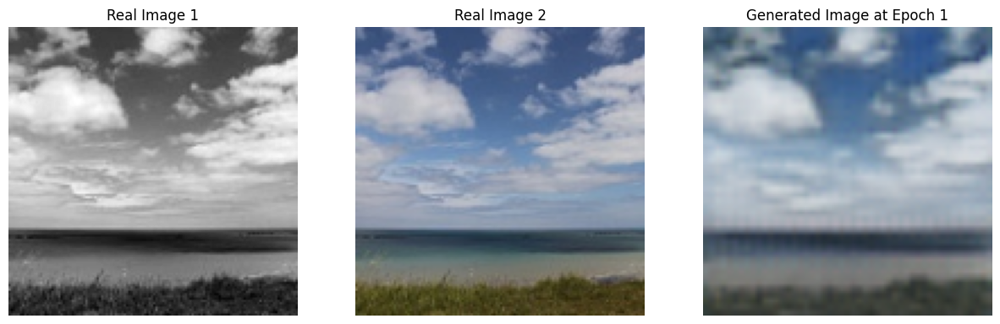

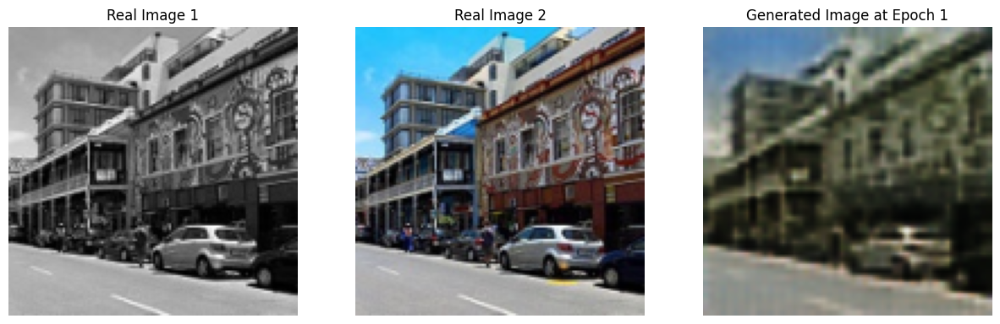

Epoch [2/101], d_loss: 0.0022, g_loss: 6.4186, val_loss: 8.2889
139.33539128303528
Epoch [3/101], d_loss: 0.0003, g_loss: 9.1538, val_loss: 8.2109
139.32009077072144
Epoch [4/101], d_loss: 0.0002, g_loss: 8.9387, val_loss: 7.8988
139.1631214618683
Epoch [5/101], d_loss: 1.3880, g_loss: 7.8659, val_loss: 7.1315
139.2562961578369


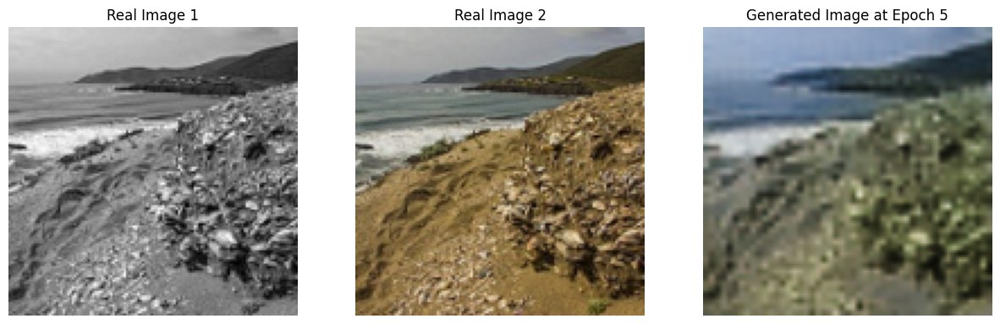

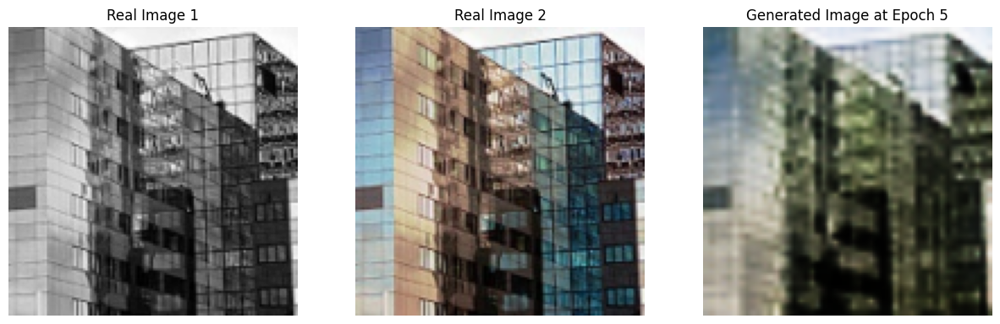

Epoch [6/101], d_loss: 1.2807, g_loss: 8.3006, val_loss: 7.2464
139.15664672851562
Epoch [7/101], d_loss: 1.3136, g_loss: 6.4660, val_loss: 7.4138
139.15105962753296
Epoch [8/101], d_loss: 1.3875, g_loss: 7.0931, val_loss: 7.0366
139.25225591659546
Epoch [9/101], d_loss: 0.0065, g_loss: 7.4360, val_loss: 7.6981
139.1633551120758
Epoch [10/101], d_loss: 0.0008, g_loss: 7.4352, val_loss: 7.7344
139.11468958854675


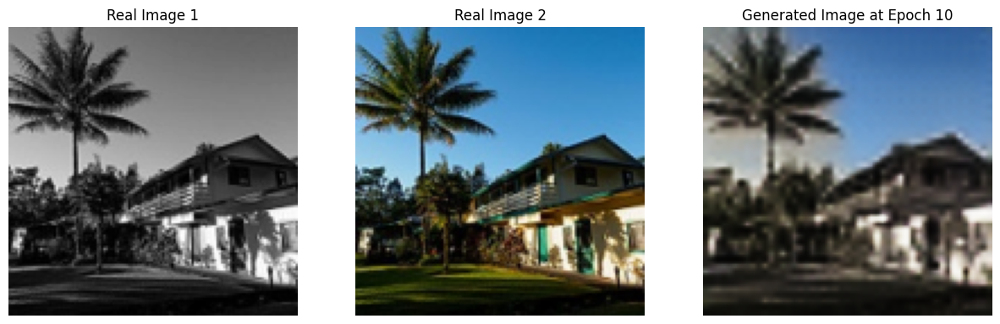

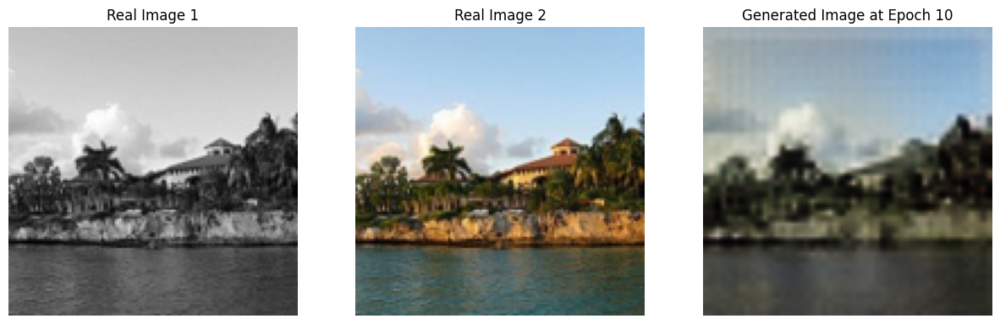

Epoch [11/101], d_loss: 0.0006, g_loss: 6.6351, val_loss: 7.4411
139.18021512031555
Epoch [12/101], d_loss: 0.0007, g_loss: 7.9837, val_loss: 7.5814
139.17905831336975
Epoch [13/101], d_loss: 0.0004, g_loss: 7.4910, val_loss: 7.4862
139.244863986969
Epoch [14/101], d_loss: 0.0005, g_loss: 7.2189, val_loss: 7.4259
139.20402240753174
Epoch [15/101], d_loss: 0.0003, g_loss: 8.4416, val_loss: 7.9401
139.21764516830444


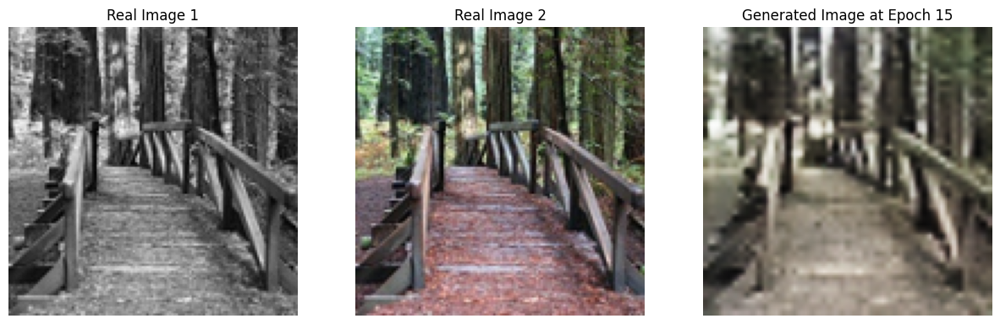

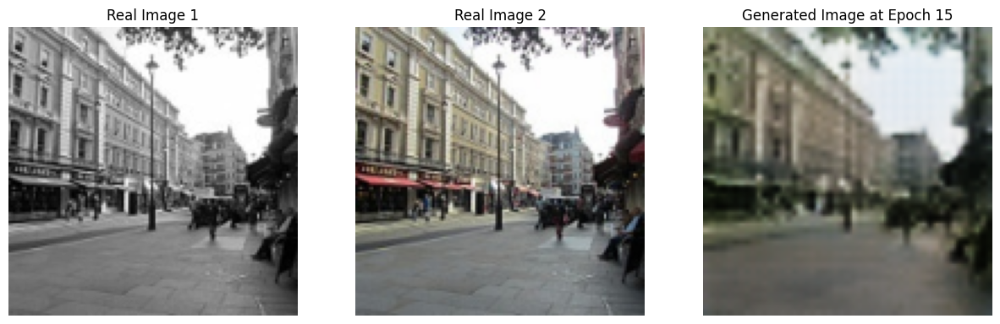

Epoch [16/101], d_loss: 0.0001, g_loss: 6.7957, val_loss: 7.4124
139.2902536392212
Epoch [17/101], d_loss: 0.0001, g_loss: 9.8526, val_loss: 7.4006
139.15319871902466
Epoch [18/101], d_loss: 0.0002, g_loss: 7.1614, val_loss: 7.5186
139.14585542678833
Epoch [19/101], d_loss: 0.0002, g_loss: 7.8218, val_loss: 7.3154
139.18577098846436
Epoch [20/101], d_loss: 0.0002, g_loss: 7.2834, val_loss: 7.7613
139.11670017242432


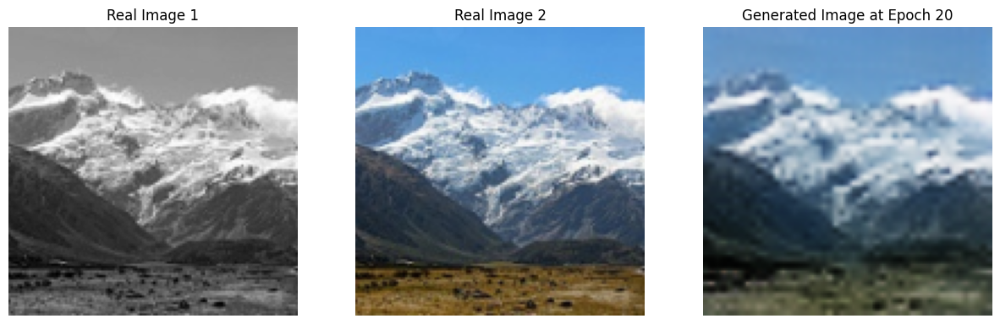

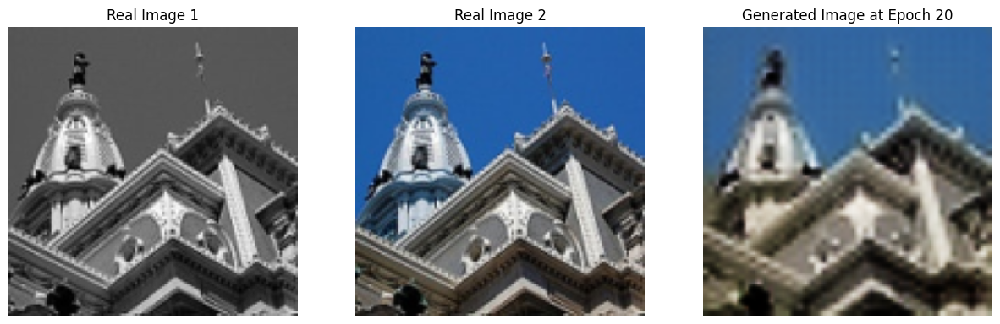

Epoch [21/101], d_loss: 0.0001, g_loss: 6.8154, val_loss: 7.5238
139.2320430278778
Epoch [22/101], d_loss: 0.0002, g_loss: 9.6194, val_loss: 7.4050
139.1275918483734
Epoch [23/101], d_loss: 0.0001, g_loss: 6.2610, val_loss: 7.3510
139.16280674934387
Epoch [24/101], d_loss: 0.0001, g_loss: 6.0373, val_loss: 7.4864
139.17014241218567
Epoch [25/101], d_loss: 0.0001, g_loss: 6.5665, val_loss: 7.2995
139.36350107192993


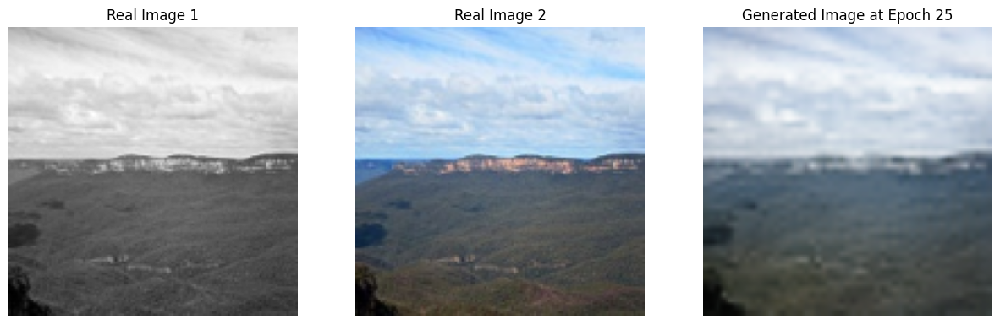

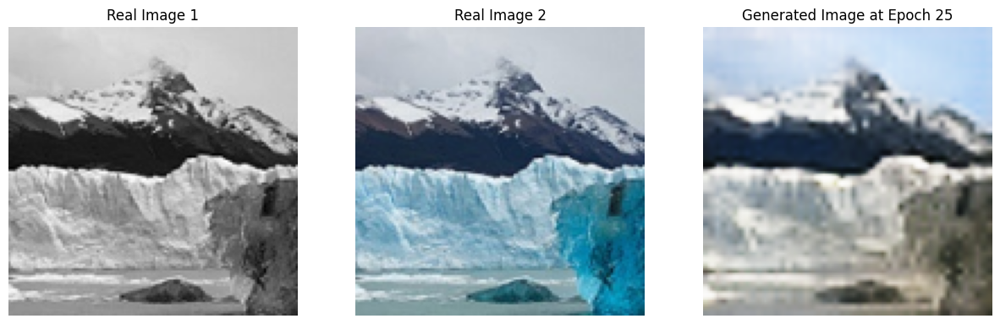

Epoch [26/101], d_loss: 0.0001, g_loss: 7.6895, val_loss: 7.6212
139.26512837409973
Epoch [27/101], d_loss: 0.0001, g_loss: 6.4996, val_loss: 7.2658
139.2999083995819
Epoch [28/101], d_loss: 0.0001, g_loss: 7.3125, val_loss: 7.2961
139.29301595687866
Epoch [29/101], d_loss: 0.0000, g_loss: 7.4307, val_loss: 7.3645
139.24854636192322
Epoch [30/101], d_loss: 0.0000, g_loss: 6.8601, val_loss: 7.3007
139.14142203330994


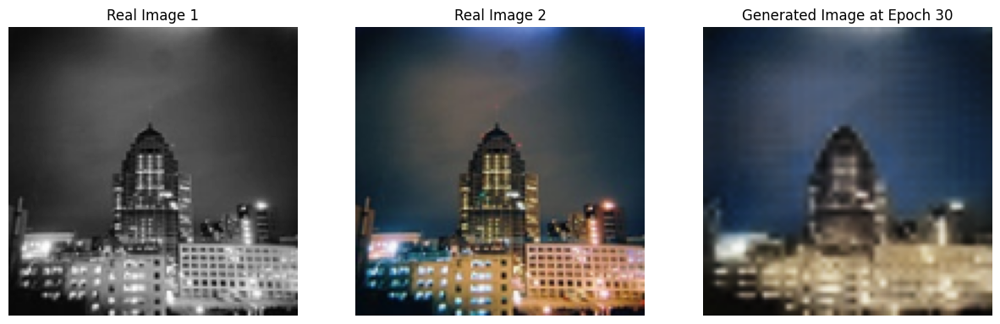

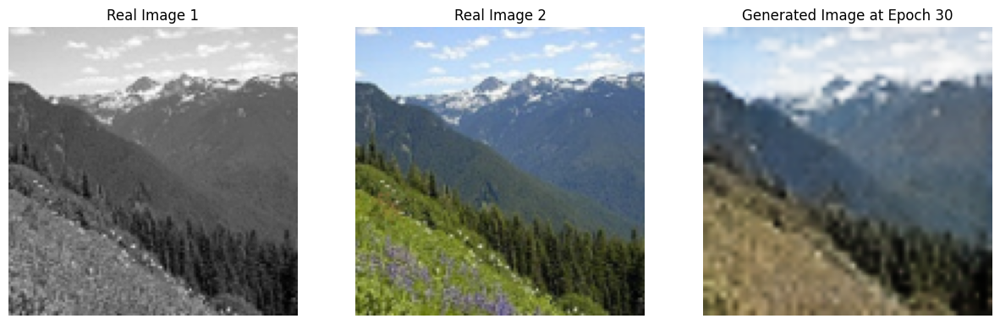

Epoch [31/101], d_loss: 0.0000, g_loss: 7.8591, val_loss: 7.4986
139.17825412750244
Epoch [32/101], d_loss: 0.0000, g_loss: 6.4122, val_loss: 7.4308
139.30663633346558
Epoch [33/101], d_loss: 0.0000, g_loss: 6.1340, val_loss: 7.4221
139.34624814987183
Epoch [34/101], d_loss: 0.0001, g_loss: 6.2350, val_loss: 7.3204
139.20831561088562
Epoch [35/101], d_loss: 0.8120, g_loss: 5.9727, val_loss: 6.9148
139.16659212112427


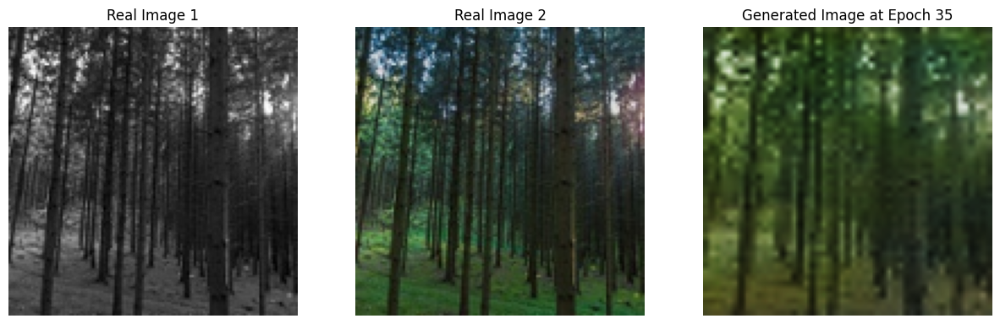

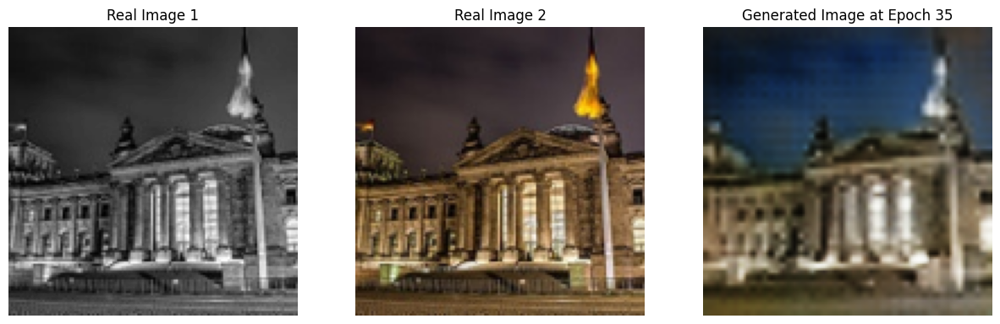

Epoch [36/101], d_loss: 0.0178, g_loss: 6.1669, val_loss: 7.2855
139.2087013721466
Epoch [37/101], d_loss: 0.0011, g_loss: 7.0577, val_loss: 7.2714
139.11577033996582
Epoch [38/101], d_loss: 0.0007, g_loss: 7.0564, val_loss: 7.2321
139.12274026870728
Epoch [39/101], d_loss: 0.0008, g_loss: 7.3223, val_loss: 7.6548
139.10338497161865
Epoch [40/101], d_loss: 0.0005, g_loss: 7.1256, val_loss: 7.3696
139.11528134346008


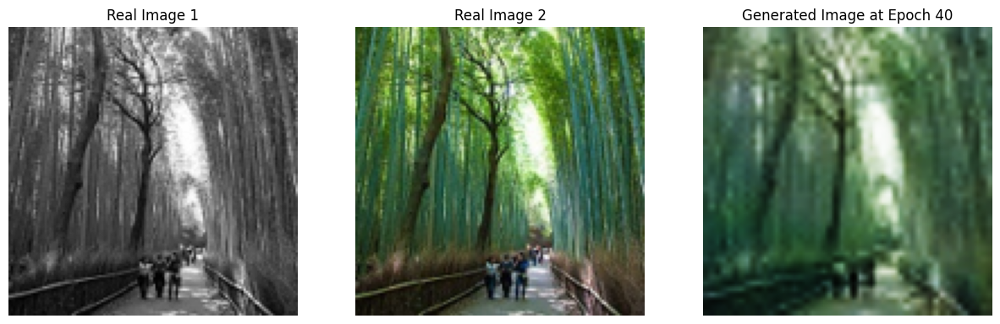

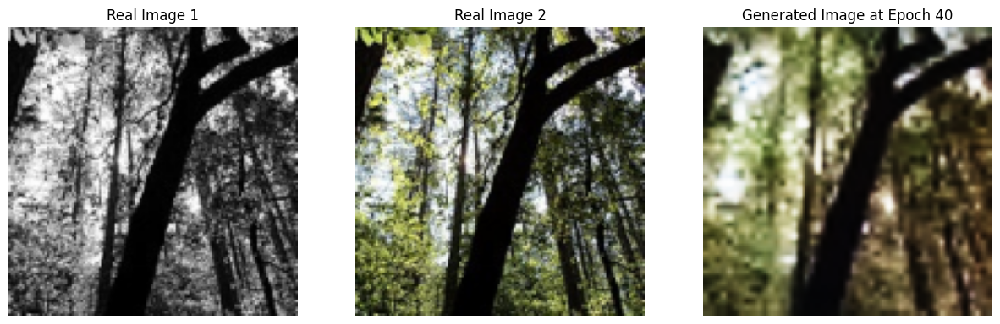

Epoch [41/101], d_loss: 0.0003, g_loss: 6.2172, val_loss: 7.3333
139.2145619392395
Epoch [42/101], d_loss: 0.0001, g_loss: 6.7351, val_loss: 7.3070
139.14572024345398
Epoch [43/101], d_loss: 0.0004, g_loss: 5.7552, val_loss: 7.1886
139.24006843566895
Epoch [44/101], d_loss: 0.0005, g_loss: 6.9656, val_loss: 7.3207
139.19692134857178
Epoch [45/101], d_loss: 0.0001, g_loss: 6.5574, val_loss: 7.2004
139.21481037139893


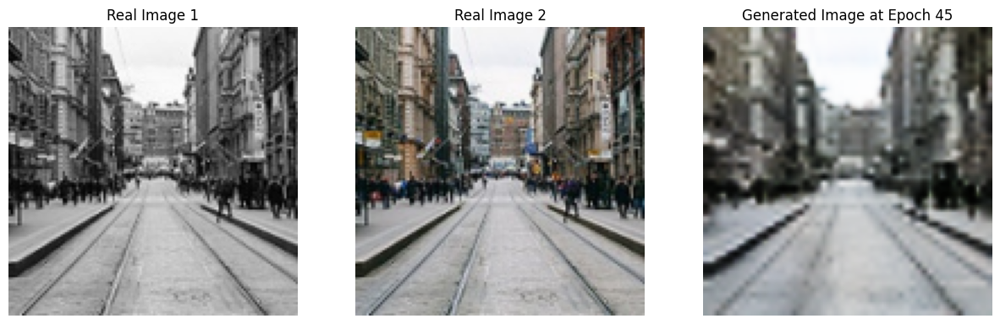

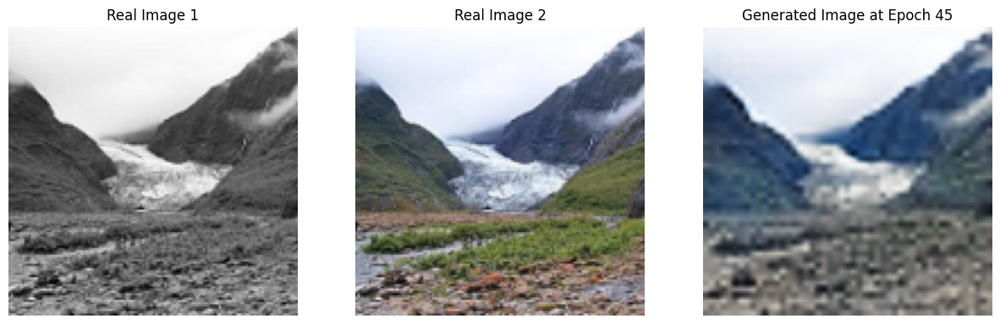

Epoch [46/101], d_loss: 0.0001, g_loss: 8.5417, val_loss: 7.3205
139.26636934280396
Epoch [47/101], d_loss: 0.0002, g_loss: 4.9323, val_loss: 7.5064
139.2917730808258
Epoch [48/101], d_loss: 0.0001, g_loss: 6.0840, val_loss: 7.2415
139.28357219696045
Epoch [49/101], d_loss: 0.0012, g_loss: 6.2493, val_loss: 7.2720
139.42546916007996
Epoch [50/101], d_loss: 0.0009, g_loss: 5.9619, val_loss: 7.3687
139.45372915267944


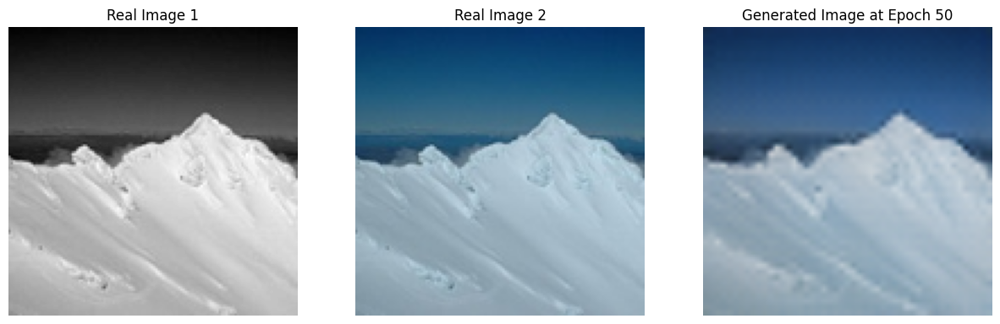

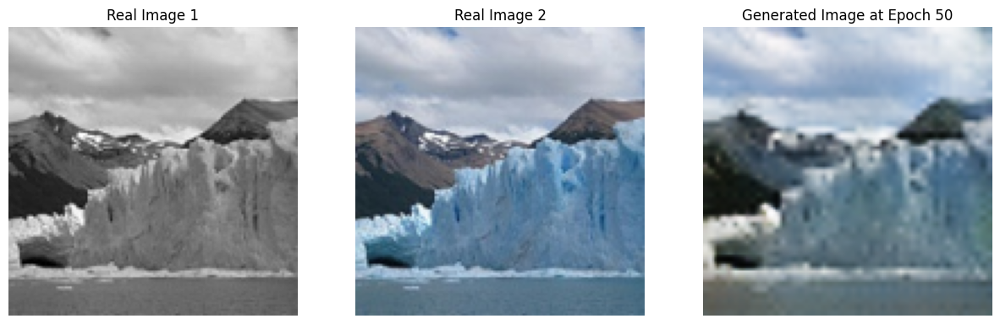

Epoch [51/101], d_loss: 0.0001, g_loss: 6.3298, val_loss: 7.2944
139.41087532043457
Epoch [52/101], d_loss: 0.0001, g_loss: 7.0251, val_loss: 7.1747
139.39892172813416
Epoch [53/101], d_loss: 0.0001, g_loss: 6.2596, val_loss: 7.2799
139.4436309337616
Epoch [54/101], d_loss: 0.0000, g_loss: 5.5830, val_loss: 7.2094
139.41889119148254
Epoch [55/101], d_loss: 0.0000, g_loss: 6.3134, val_loss: 7.2402
139.45911717414856


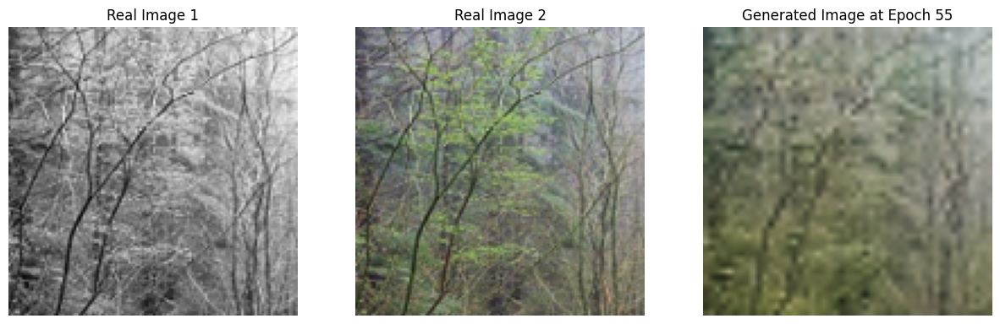

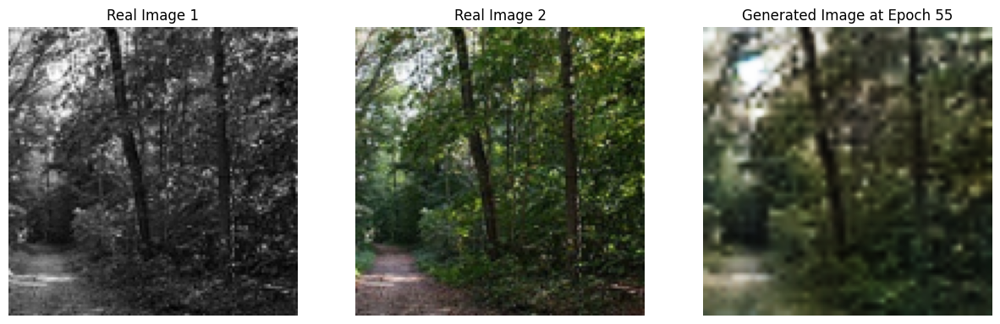

Epoch [56/101], d_loss: 0.0001, g_loss: 5.7054, val_loss: 7.3102
139.48334741592407
Epoch [57/101], d_loss: 0.0000, g_loss: 5.5098, val_loss: 7.1671
139.50063180923462
Epoch [58/101], d_loss: 0.0000, g_loss: 7.0025, val_loss: 7.5000
139.39727401733398
Epoch [59/101], d_loss: 0.0001, g_loss: 5.1784, val_loss: 7.2118
139.41124629974365
Epoch [60/101], d_loss: 0.0000, g_loss: 5.8540, val_loss: 7.2392
139.44218730926514


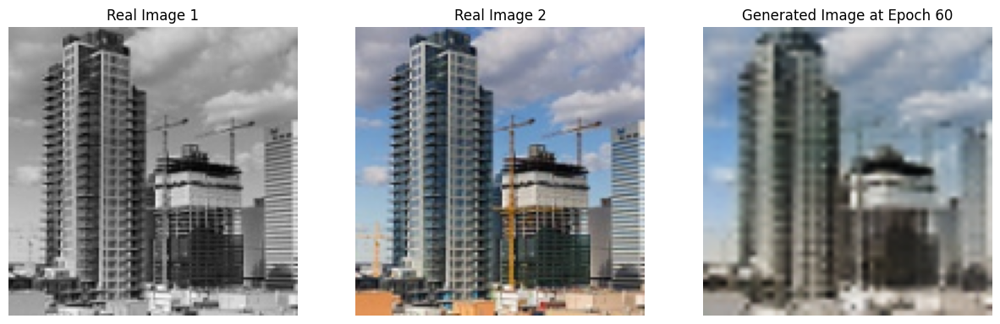

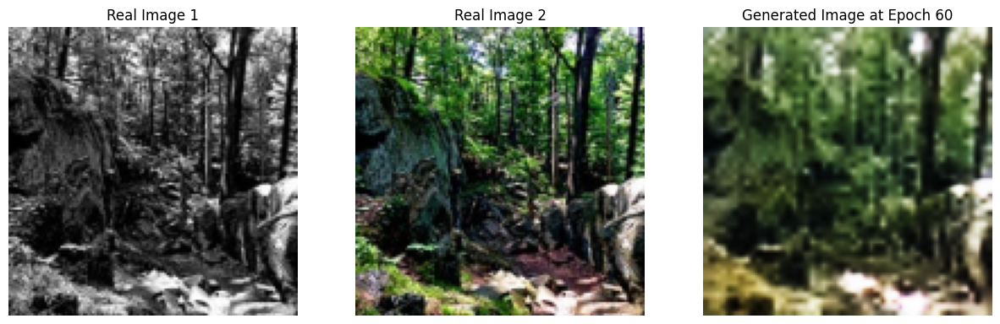

Epoch [61/101], d_loss: 0.0001, g_loss: 7.3663, val_loss: 7.3037
139.44935607910156
Epoch [62/101], d_loss: 0.0001, g_loss: 6.4776, val_loss: 7.2695
139.39932584762573
Epoch [63/101], d_loss: 0.0000, g_loss: 6.0484, val_loss: 7.3894
139.4760594367981
Epoch [64/101], d_loss: 0.0000, g_loss: 4.7404, val_loss: 7.2454
139.48514533042908
Epoch [65/101], d_loss: 0.0001, g_loss: 7.1563, val_loss: 7.1824
139.41877150535583


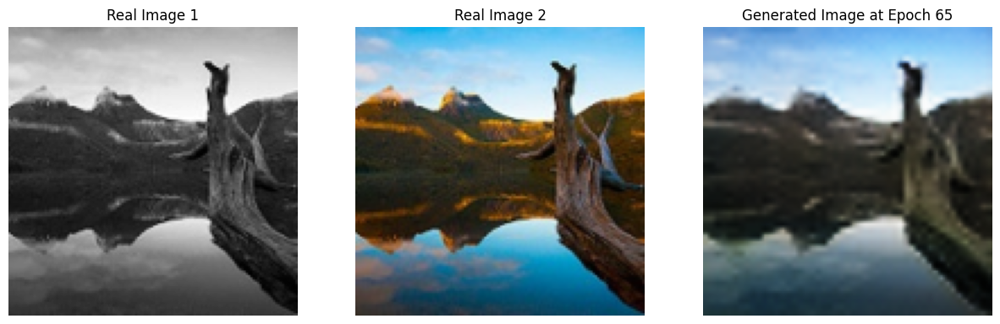

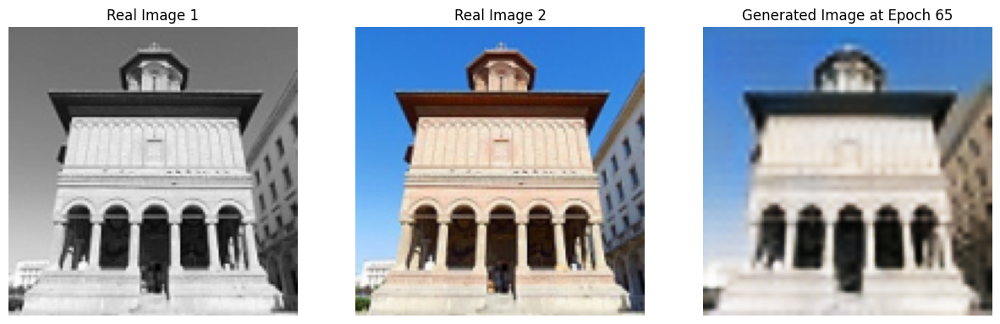

KeyboardInterrupt: 

In [14]:
from matplotlib import pyplot as plt

# Instanciando o modelo GAN
gan = PaisagemGAN(generator=gene, discriminator=disc)
gan = gan.to(device)
gan.compile(g_loss=g_loss, d_loss=d_loss)

# Número de épocas
num_epochs = 101


# Loop de treinamento
print("Iniciar treinamento")
val_losses = []
for epoch in range(num_epochs):
    i = 0
    inicio = time.time()
    for batch in train_loader:
        real_images = normalize(batch[1].to(device))
        grey_images = normalize(batch[0].to(device))
        loss = gan.train_step(real_images, grey_images)
        i += 1
        real_images.cpu()
        grey_images.cpu()
    
    # Avaliação no conjunto de validação
    val_loss = 0.0
    with torch.no_grad():
        for val_batch in val_loader:
            val_real_images = normalize(val_batch[1].to(device))
            val_grey_images = normalize(val_batch[0].to(device))
            val_fake_images = gan.generator(val_grey_images)
            val_yhat_fake = gan.discriminator(val_fake_images)
            last_v_loss = g_loss(val_yhat_fake, val_fake_images, val_real_images)
            val_loss += last_v_loss.item()
            val_real_images.cpu()
            val_grey_images.cpu()
    
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    
    print(f"Epoch [{epoch+1}/{num_epochs}], d_loss: {loss['d_loss']:.4f}, g_loss: {loss['g_loss']:.4f}, val_loss: {val_loss:.4f}")
    fim = time.time()
    print(fim - inicio)

    if (epoch+1) % 5 == 0 or (epoch) == 0:
        save_checkpoint(gan.generator, gan.g_opt, epoch, batch, loss, filepath='/kaggle/working/gen.pth')
        save_checkpoint(gan.discriminator, gan.d_opt, epoch, batch, loss, filepath='/kaggle/working/disc.pth')

        # Desenhando evoluçao do treinamento
        # Convertendo as imagens geradas de 0-1 para 0-255
        gen_image = (loss['gen'][0].detach().cpu().numpy().transpose(1, 2, 0) * 255).astype('uint8')

        # Convertendo batch[0] e batch[1] de 0-1 para 0-255
        real_image1 = (batch[0][0].detach().cpu().numpy().squeeze()*255).astype('uint8')
        real_image2 = (batch[1][0].detach().cpu().numpy().transpose(1, 2, 0)*255 ).astype('uint8')

        # Plotando as três imagens lado a lado
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        axes[0].imshow(real_image1, cmap='gray')
        axes[0].set_title("Real Image 1")

        axes[1].imshow(real_image2)
        axes[1].set_title("Real Image 2")

        axes[2].imshow(gen_image)
        axes[2].set_title(f"Generated Image at Epoch {epoch + 1}")

        for ax in axes:
            ax.axis('off')  # Remove os eixos

        plt.show()

        # Desenhando evolução da validação
        # Convertendo as imagens geradas de 0-1 para 0-255
        gen_image = (val_fake_images[0].detach().cpu().numpy().transpose(1, 2, 0) * 255).astype('uint8')

        # Convertendo batch[0] e batch[1] de 0-1 para 0-255
        real_image1 = (val_grey_images[0].detach().cpu().numpy().squeeze()*255).astype('uint8')
        real_image2 = (val_real_images[0].detach().cpu().numpy().transpose(1, 2, 0)*255 ).astype('uint8')

        # Plotando as três imagens lado a lado
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        axes[0].imshow(real_image1, cmap='gray')
        axes[0].set_title("Real Image 1")

        axes[1].imshow(real_image2)
        axes[1].set_title("Real Image 2")

        axes[2].imshow(gen_image)
        axes[2].set_title(f"Generated Image at Epoch {epoch + 1}")

        for ax in axes:
            ax.axis('off')

        plt.show()
        

print("Treinamento concluído!")


In [19]:
#torch.cuda.empty_cache()
print(val_losses)

[8.652662637498644, 8.288866890801323, 8.210886934068467, 7.89883017539978, 7.131527291403876, 7.246433803770278, 7.413773843977187, 7.036561483807034, 7.698083808686998, 7.734412346945868, 7.441138474146525, 7.5813717206319176, 7.486164787080553, 7.425854131910536, 7.940105846193101, 7.412418916490343, 7.4006412718031145, 7.51857427491082, 7.315429316626655, 7.761267185211182, 7.523761733373006, 7.404985025193956, 7.351045269436306, 7.486387962765164, 7.299501175350613, 7.621204847759671, 7.2658222357432045, 7.296090835995145, 7.364486816194322, 7.300678253173828, 7.4986491203308105, 7.430820634629991, 7.422079902225071, 7.320400359895494, 6.914783414204916, 7.285493432150947, 7.271394840876261, 7.232084343168471, 7.6547881497277155, 7.369647206200494, 7.333335987726847, 7.306972249348958, 7.188581042819553, 7.320664840274387, 7.200430700514052, 7.320524326960245, 7.506401994493273, 7.241465791066488, 7.271965673234727, 7.368674506081475, 7.294376309712728, 7.17470006942749, 7.2799344

In [21]:
import csv

# Caminho do arquivo onde as perdas serão salvas
loss_file_path = '/kaggle/working/losses.csv'

# Função para salvar as perdas em um arquivo CSV
def save_losses_to_csv(val_losses, file_path):
    with open(file_path, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['Epoch', 'Train Loss', 'Validation Loss'])
        for epoch, val_loss in enumerate(val_losses, start=1):
            writer.writerow([epoch, 0, val_loss])
            print("i")

# Salvar as perdas
save_losses_to_csv(val_losses, loss_file_path)

print(f"Losses saved to {loss_file_path}")

i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
i
Losses saved to /kaggle/working/losses.csv
